In [116]:
import pandas as pd
import sys
import os
import matplotlib.pyplot as plt
import openslide

import numpy as np
from PIL import Image
from skimage.filters import threshold_otsu
from skimage.morphology import binary_opening, binary_closing, remove_small_objects, convex_hull_image
import torchvision.transforms.functional as F
#from torchvision.utils import make_grid
from torchvision.io import read_image
from pathlib import Path

Set data directory

In [2]:
DATA_DIR = 'Data/'

In [3]:
os.listdir(DATA_DIR)

['Code',
 'train_images',
 'test_thumbnails',
 'train_thumbnails',
 'train.csv',
 '.ipynb_checkpoints',
 'test.csv',
 'test_images',
 'sample_submission.csv',
 'UBC-OCEAN.zip',
 'updated_image_ids.json']

In [4]:
os.listdir(os.path.join(DATA_DIR, 'train_images'))

['20858.png',
 '52259.png',
 '15139.png',
 '22290.png',
 '18138.png',
 '48550.png',
 '22425.png',
 '8279.png',
 '44962.png',
 '11559.png',
 '14424.png',
 '43280.png',
 '38366.png',
 '44581.png',
 '16986.png',
 '63165.png',
 '37307.png',
 '27315.png',
 '26219.png',
 '35652.png',
 '57162.png',
 '6951.png',
 '7482.png',
 '48861.png',
 '51032.png',
 '53688.png',
 '39728.png',
 '57100.png',
 '43998.png',
 '30738.png',
 '14542.png',
 '6898.png',
 '34649.png',
 '52846.png',
 '21373.png',
 '38535.png',
 '14617.png',
 '31297.png',
 '25561.png',
 '30986.png',
 '38048.png',
 '35998.png',
 '30515.png',
 '49942.png',
 '21303.png',
 '29615.png',
 '47105.png',
 '61424.png',
 '49872.png',
 '53098.png',
 '47020.png',
 '9254.png',
 '30272.png',
 '24617.png',
 '37190.png',
 '38097.png',
 '43815.png',
 '50878.png',
 '65022.png',
 '30792.png',
 '46769.png',
 '25928.png',
 '61689.png',
 '6175.png',
 '41361.png',
 '14039.png',
 '18196.png',
 '8240.png',
 '11263.png',
 '33839.png',
 '16876.png',
 '6359.png',


Load label data

In [5]:
train_df = pd.read_csv(os.path.join(DATA_DIR, 'train.csv'))
train_df

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
...,...,...,...,...,...
533,65022,LGSC,53355,46675,False
534,65094,MC,55042,45080,False
535,65300,HGSC,75860,27503,False
536,65371,HGSC,42551,41800,False


Choose random image to view

In [6]:
random_id = '9154'

image_path = os.path.join(DATA_DIR, 'train_images', f'{random_id}.png')
assert os.path.exists(image_path)

In [7]:
image_path

'/well/rittscher/users/axs296/Data/train_images/9154.png'

### Original images are too large to load and view

With openslide (png unsupported) and PIL (attack) at least. Could try pyvips as well.

### View thumbnails instead

In [8]:
random_id = '9154'

image_path = os.path.join(DATA_DIR, 'train_thumbnails', f'{random_id}_thumbnail.png')
assert os.path.exists(image_path)

Background already filtered!

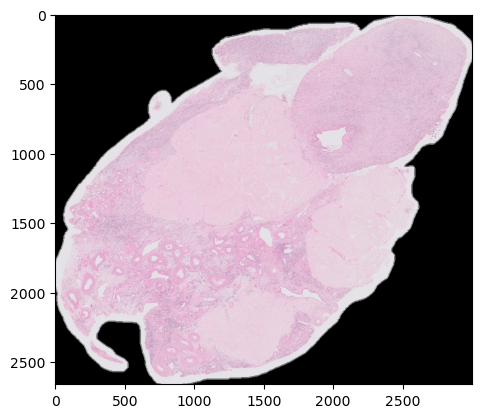

In [9]:
img = np.array(Image.open(image_path))[..., :3]
plt.imshow(img)
plt.show()

#### Try filtering background - this is silly

In [10]:
# filter background
mask = np.sum(img, axis=2) == 0
img[mask, :] = 255
if np.max(img) < 1.5:
    img = np.clip(img * 255, 0, 255).astype(np.uint8)

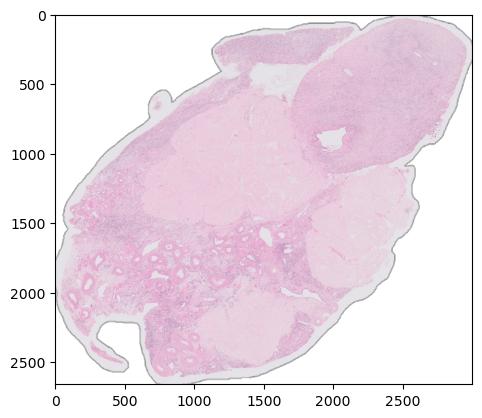

In [11]:
plt.imshow(img)

### View all images

In [12]:
files = os.listdir(os.path.join(DATA_DIR, 'train_thumbnails'))
len(files)

513

torch.Size([3, 879, 3000])
torch.Size([3, 2667, 3000])
torch.Size([3, 3149, 3000])
torch.Size([3, 2073, 3000])
torch.Size([3, 2104, 3000])


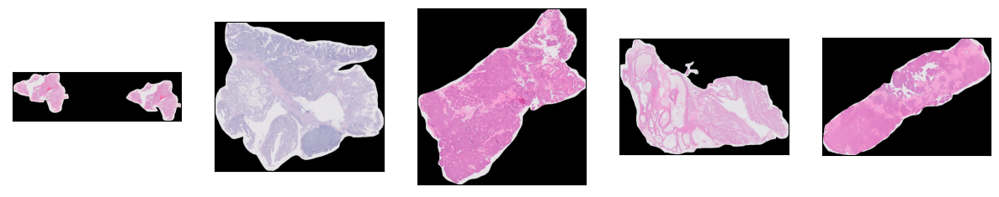

In [13]:
plt.rcParams["savefig.bbox"] = 'tight'

def show(imgs, ncols=5):
    if not isinstance(imgs, list):
        imgs = [imgs]
    num_imgs = len(imgs)
    nrows = int(np.ceil(num_imgs / ncols))
    fig, axs = plt.subplots(ncols=ncols, squeeze=False, figsize=(15,nrows*8))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[i // ncols, i % ncols].imshow(np.asarray(img))
        axs[i // ncols, i % ncols].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])


img_list = []
for num, image_name in enumerate(files[:5]):
    image_path = os.path.join(DATA_DIR, 'train_thumbnails', image_name)
    image = read_image(image_path)
    print(image.shape)
    img_list.append(image)
    
#grid = make_grid(img_list)
show(img_list)  

Load in real time instead of storing all in a list

In [14]:
def load_and_plot_thumbnails(thumbnail_files, folder='train_thumbnails'):
    plt.rcParams["savefig.bbox"] = 'tight'

    ncols = 5
    num_imgs = len(thumbnail_files)
    nrows = int(np.ceil(num_imgs / ncols))
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, squeeze=False, figsize=(12,nrows*3))
    for i, image_name in enumerate(thumbnail_files):
        image_path = os.path.join(DATA_DIR, folder, image_name)
        img = read_image(image_path).detach()
        #img = img.detach()
        img = F.to_pil_image(img)
        #print(f'Plotting at axis {i // ncols}, {i % ncols}')
        axs[i // ncols, i % ncols].imshow(np.asarray(img))
        axs[i // ncols, i % ncols].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        axs[i // ncols, i % ncols].set_title(image_name.split('_')[0])

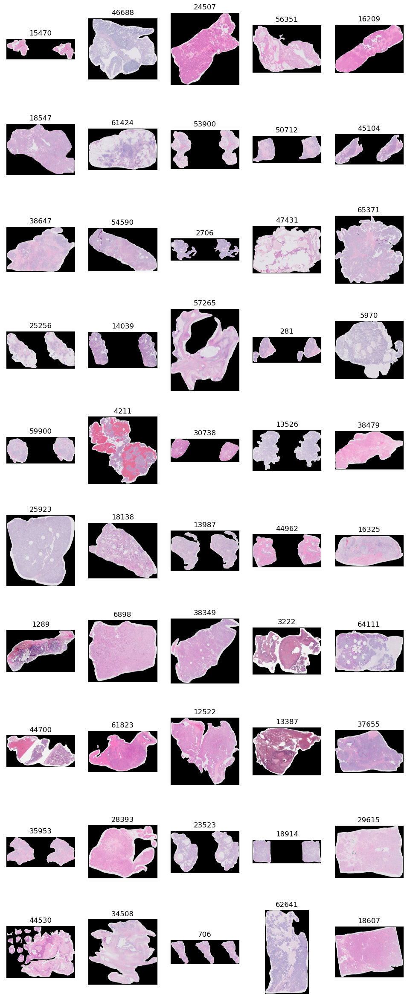

In [80]:
load_and_plot_thumbnails(files[:50])

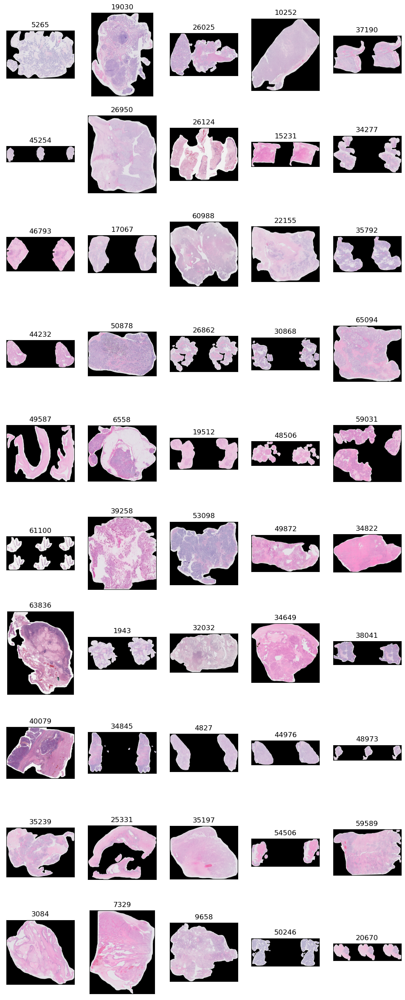

In [81]:
load_and_plot_thumbnails(files[50:100])

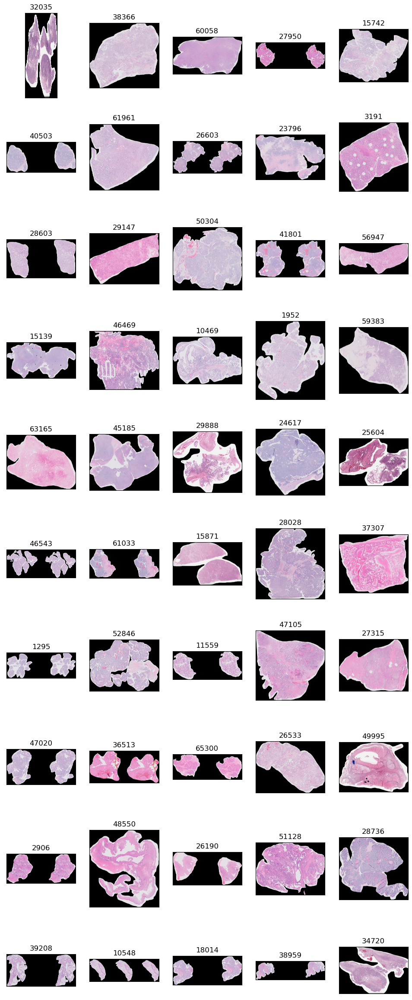

In [82]:
load_and_plot_thumbnails(files[100:150])

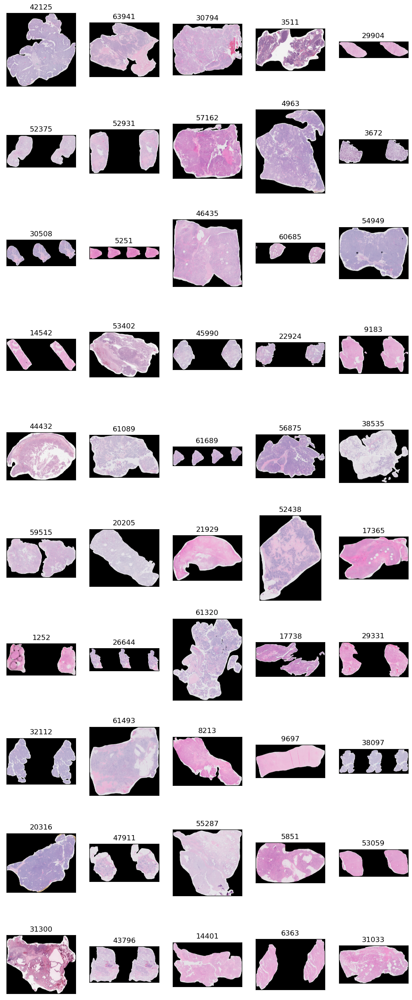

In [83]:
load_and_plot_thumbnails(files[150:200])

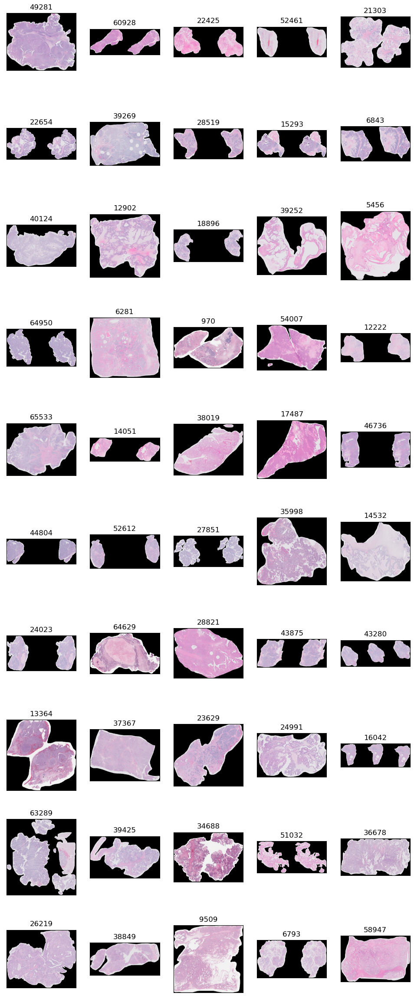

In [84]:
load_and_plot_thumbnails(files[200:250])

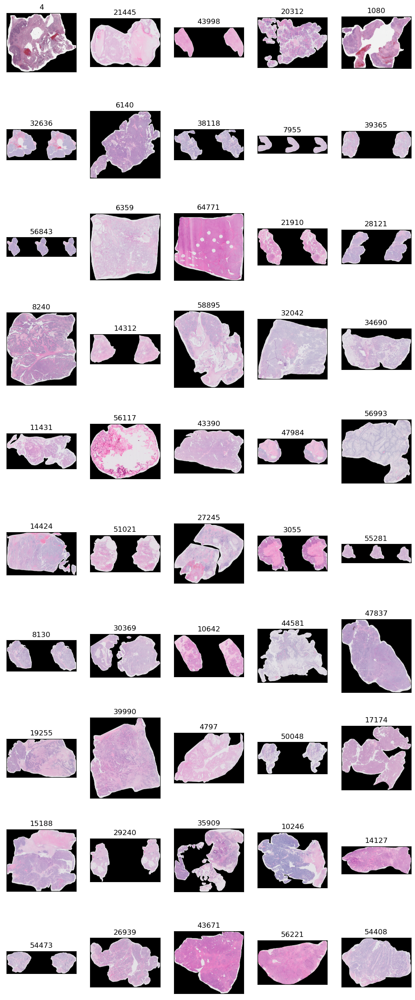

In [85]:
load_and_plot_thumbnails(files[250:300])

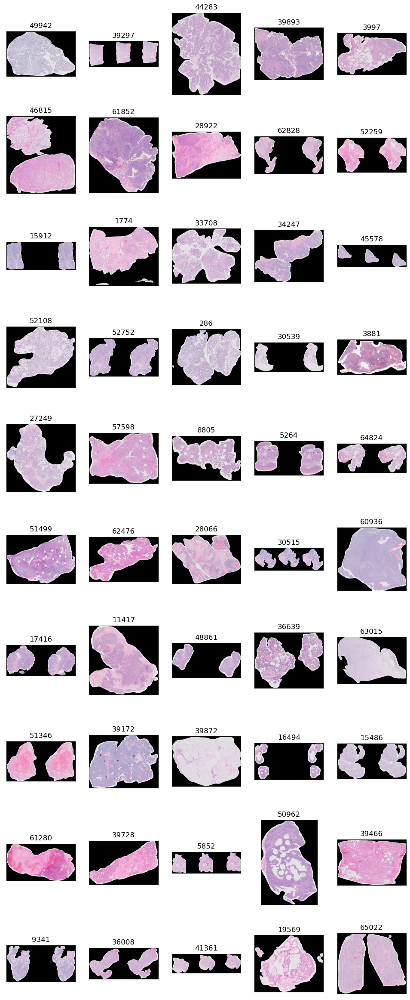

In [86]:
load_and_plot_thumbnails(files[300:350])

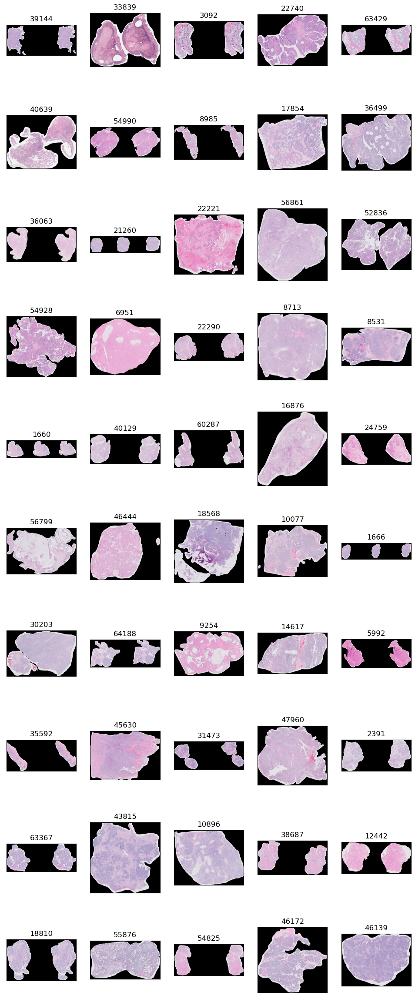

In [87]:
load_and_plot_thumbnails(files[350:400])

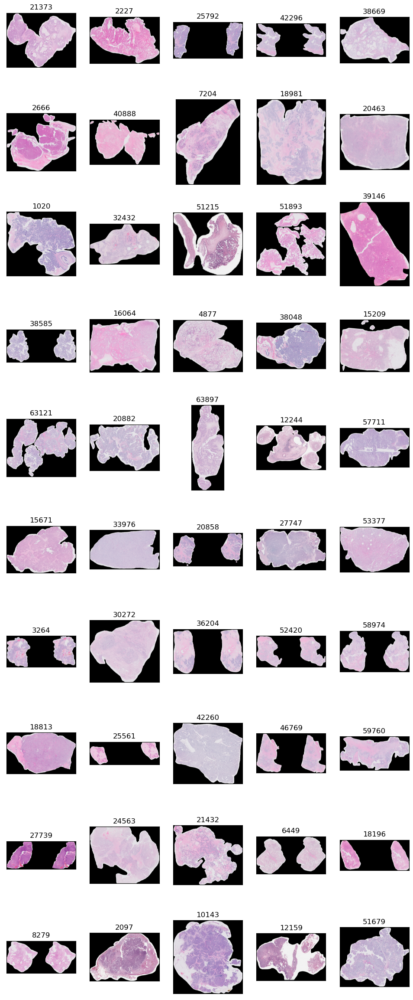

In [88]:
load_and_plot_thumbnails(files[400:450])

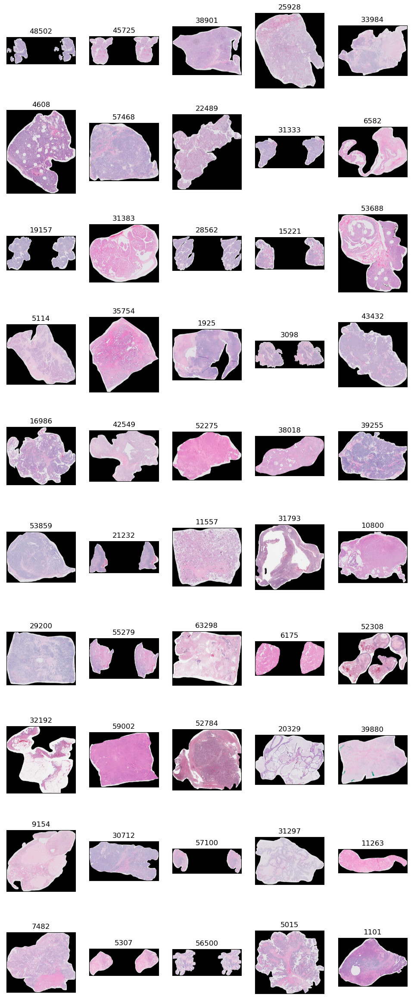

In [89]:
load_and_plot_thumbnails(files[450:500])

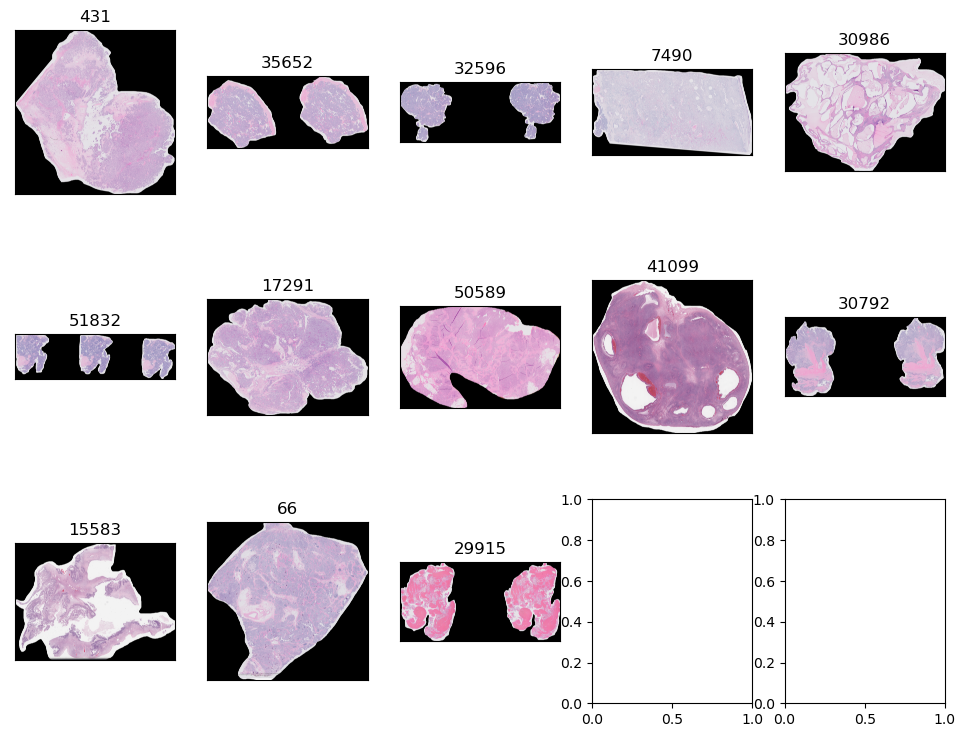

In [90]:
load_and_plot_thumbnails(files[500:])

### Some of the background masks are rubbish

They leave a lot of white space unmasked.

Some images have more than one sample per image, max 4 per image. Could be more samples per image in hidden test set. Other images are one large sample.

### Plot TMA images too

No thumbnails of TMA images since they are already small and do not need to be resized in order to load.

In [100]:
tma_files = list(map(lambda image_id: f'{image_id}.png',train_df[train_df.is_tma==True].image_id.values))

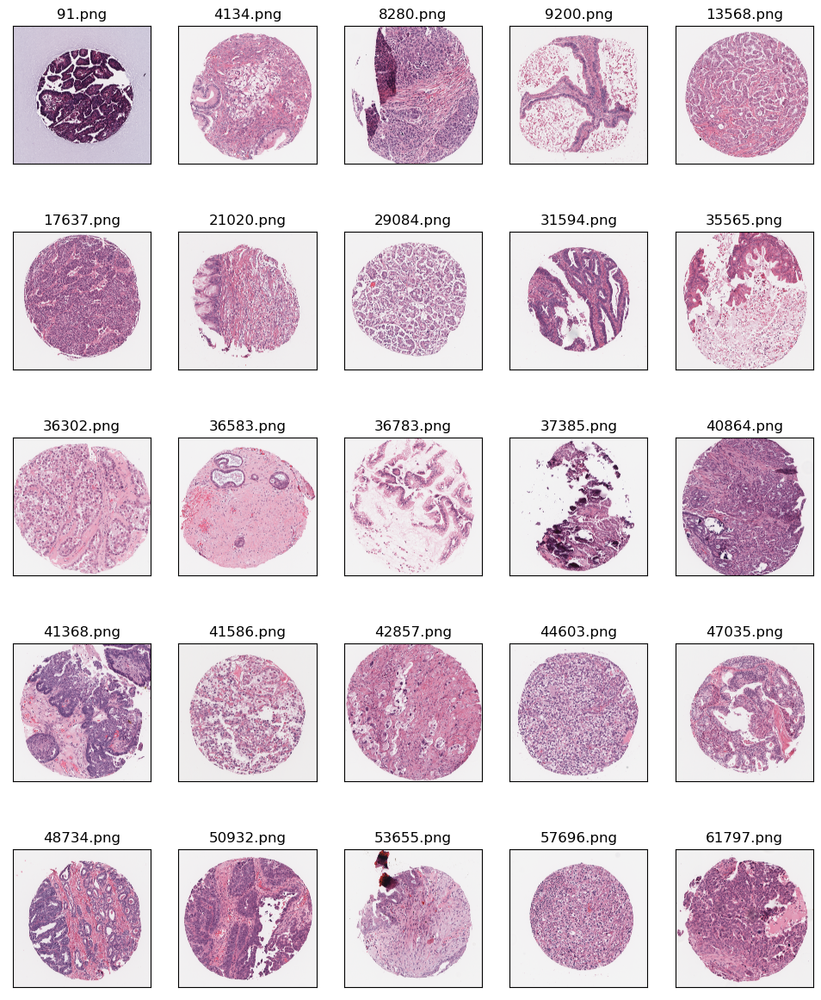

In [103]:
load_and_plot_thumbnails(tma_files, folder='train_images')

Background not already filtered for TMAs. 

All are roughly circular.